# Advance Lane Detection Project

For a more detailed information on the goals, and specific of the project, please refer to the README file.

## Camera calibration and undistorting images

In [1]:
import cv2
import glob
import numpy as np
import os
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

In [2]:
### group calibration and undistortion together

def cal_undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
        objpoints, imgpoints, img.shape[0:2], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist, mtx, dist


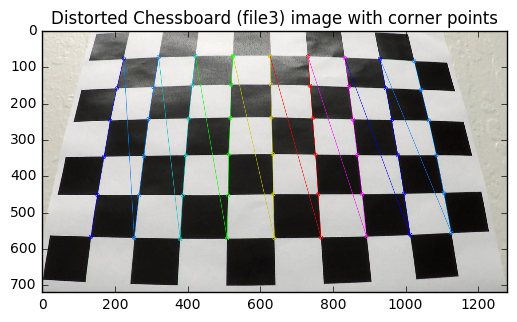

In [3]:
### test undistorting images with camera calibration

test_image_fname = './camera_cal/calibration3.jpg'
test_image = mpimg.imread(test_image_fname)
test_gray = cv2.cvtColor(test_image, cv2.COLOR_BGR2GRAY)

ret, corners = cv2.findChessboardCorners(test_gray, (6, 9), None)

if ret == True:
    cv2.drawChessboardCorners(test_image, (6, 9), corners, ret)
    plt.imshow(test_image)
    plt.title("Distorted Chessboard (file3) image with corner points")
    plt.show()

In [4]:
### import the calibration images and calibrate camera to undistort

images = glob.glob('./camera_cal/calibration*.jpg')
## interpolating 2d space to 3d space
objpoints = []
imgpoints = []

# x,y coordinate combinations
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# for each file, convert to grayscale, find corners
for fname in images:
    img = mpimg.imread(fname)
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    
    if ret == True:
        print(fname)
        imgpoints.append(corners)
        objpoints.append(objp)


./camera_cal/calibration10.jpg
./camera_cal/calibration11.jpg
./camera_cal/calibration12.jpg
./camera_cal/calibration13.jpg
./camera_cal/calibration14.jpg
./camera_cal/calibration15.jpg
./camera_cal/calibration16.jpg
./camera_cal/calibration17.jpg
./camera_cal/calibration18.jpg
./camera_cal/calibration19.jpg
./camera_cal/calibration2.jpg
./camera_cal/calibration20.jpg
./camera_cal/calibration3.jpg
./camera_cal/calibration6.jpg
./camera_cal/calibration7.jpg
./camera_cal/calibration8.jpg
./camera_cal/calibration9.jpg


In [5]:
### Output undistorted test image and the mts and distortion matrix
test_undist, mtx, dist = cal_undistort(test_image, objpoints, imgpoints)

In [6]:
### OPTIONAL: Save the outputs to a pickle file.
output_file = "distortion.p"
if not os.path.isfile(output_file):
    print('Pickle file not found. Saving data to pickle file.')
    dist_data_pickle = {}
    dist_data_pickle["mtx"] = mtx
    dist_data_pickle["dist"] = dist
    pickle.dump(dist_data_pickle, open(output_file,"wb"))
else: 
    print('Pickle file is already found. Skip this step')

Pickle file is already found. Skip this step


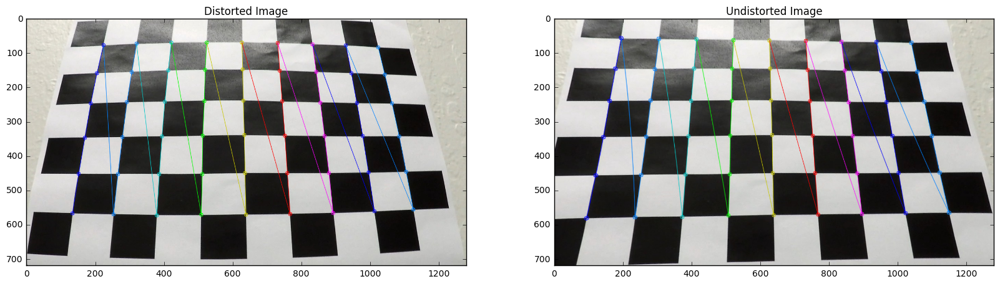

In [7]:
### Compare the test images (undistorted and distorted) side by side

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(test_image)
ax1.set_title('Distorted Image')
ax2.imshow(test_undist)
ax2.set_title('Undistorted Image')

## Color/Gradient Thresholding

### Thresholding methods

#### Sobel gradient thresholding

- Absolute sobel thresholding
- Gradient magnitude thresholding
- Gradient direction thresholding

#### Color thresholding

- HLS thresholding


In [8]:
'''
Sobel gradient thresholding

INPUT
    orient: orientation of the sobel gradient - x or y
    thresh: threshold for the gradient (low, high)

'''

def abs_threshold(img, orient='x', sobel_kernel=3, thresh=(0,255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Sobel gradient depending on the orientation
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    return sobel
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel >= thresh[0])\
                 & (scaled_sobel <= thresh[1])] = 1
    
    return sobel_binary

# Helper function for the rest of the gradient thresholds
def sobel_operator_ksize(img, sobel_kernel=3):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    return sobelx, sobely

In [9]:
'''
Gradient magnitude thresholding

'''

def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):
    sobelx, sobely = sobel_operator_ksize(img, sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0])\
                  & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

In [10]:
'''
Gradient direction thresholding

'''

def dir_threshold(img, sobel_kernel=3, dir_thresh=(0, np.pi/2)):
    sobelx, sobely = sobel_operator_ksize(img, sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= dir_thresh[0])\
                  & (absgraddir <= dir_thresh[1])] = 1
    
    # Return the binary image
    return binary_output

In [11]:
'''
HLS color thresholding

'''

def hls_threshold(img, thresh=(0,255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(hls[:,:,2])
    # 3) Return a binary image of threshold result
    binary_output[(hls[:,:,2] <= thresh[1])\
                  & (hls[:,:,2] >= thresh[0])] = 1 
    
    return binary_output

In [12]:
def masking_region(img, vertices):
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

### Combining the thresholding methods

Thresholding methods are combined to best detect lanes. From there, we will be masking to best obtain lane lines.

In [13]:
def combined_thresh(img):

    ksize = 7
    threshx = (50, 255)
    threshy = (10, 255)
    mag_thresh = (50, 255)
    dir_thresh = (0.7, 1.3)
    hls_thresh = (170, 255)

    gradx = abs_threshold(img, orient='x', sobel_kernel=ksize, thresh=threshx)
    grady = abs_threshold(img, orient='y', sobel_kernel=ksize, thresh=threshy)
    mag_binary = mag_threshold(img, sobel_kernel=ksize, mag_thresh=mag_thresh)
    dir_binary = dir_threshold(img, sobel_kernel=ksize, dir_thresh=dir_thresh) 
    hls_binary = hls_threshold(img, hls_thresh)
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1

    imshape = img.shape
    left_bottom = (100, imshape[0])
    right_bottom = (imshape[1]-20, imshape[0])
    apex1 = (610, 410)
    apex2 = (680, 410)
    inner_left_bottom = (310, imshape[0])
    inner_right_bottom = (1150, imshape[0])
    inner_apex1 = (700,480)
    inner_apex2 = (650,480)
    vertices = np.array([[left_bottom, apex1, apex2, \
                          right_bottom, inner_right_bottom, \
                          inner_apex1, inner_apex2, inner_left_bottom]], dtype=np.int32)
    # Masked area
    combined_binary = masking_region(combined_binary, vertices)
    
    return combined_binary

### Visualize the results

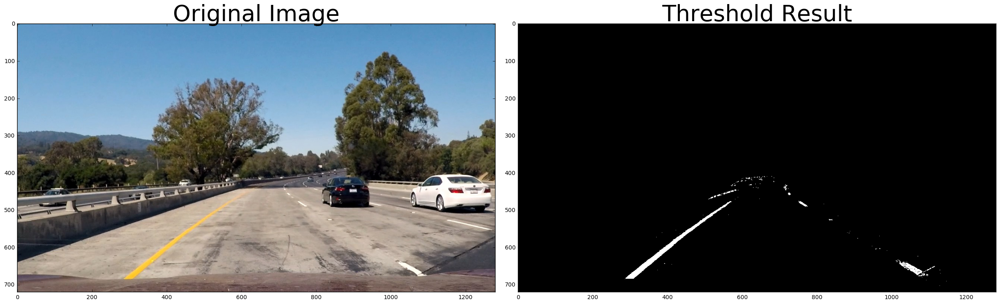

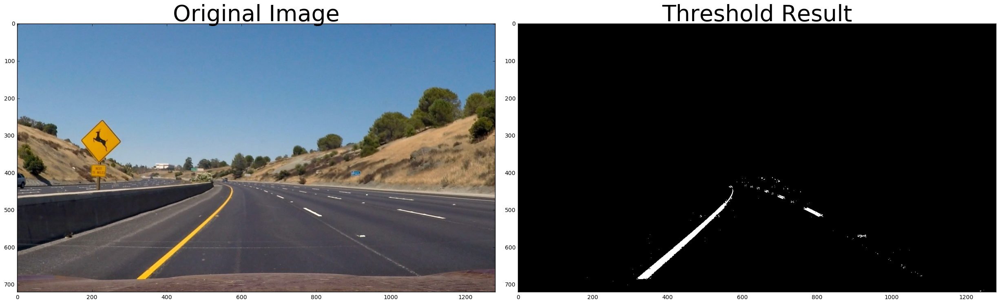

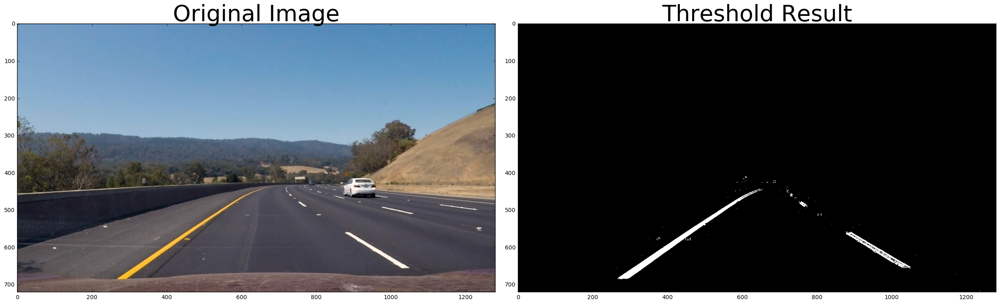

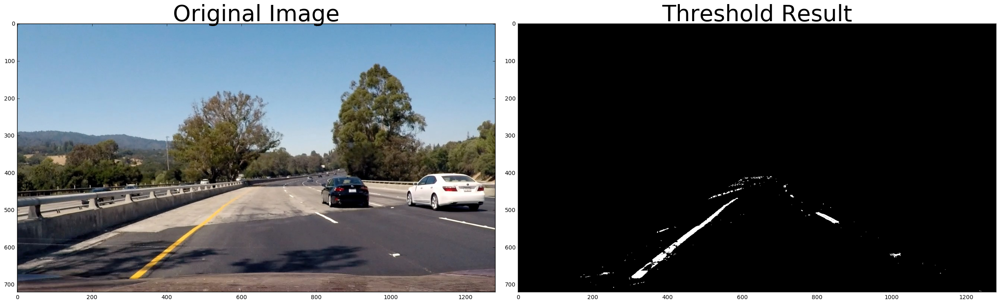

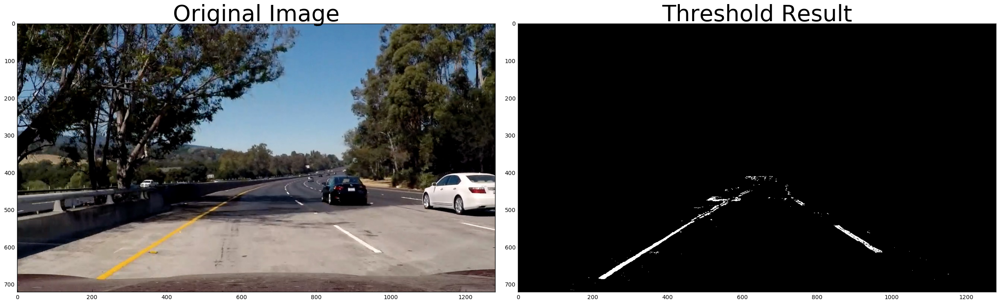

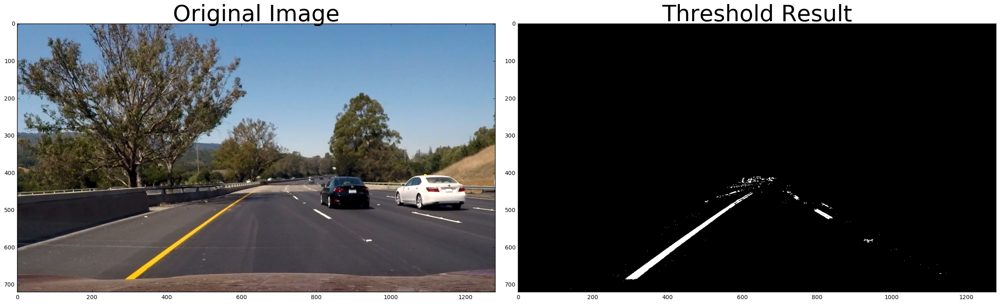

In [14]:
result_test_images = glob.glob('./test_images/test*.jpg')

for fname in result_test_images:
    pre_thresh = mpimg.imread(fname)
    post_thresh = combined_thresh(pre_thresh)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(pre_thresh)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(post_thresh, cmap='gray')
    ax2.set_title('Threshold Result', fontsize=40)
   
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Perspective Transform

In [15]:
image_shape = pre_thresh.shape
print(image_shape)

# Define the region
area_of_interest = [[150+430,460],[1150-440,460],[1150,720],[150,720]]

def perspective_transform(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    offset_x = 200
    offset_y = 0
    
    img_size = (pre_thresh.shape[1], pre_thresh.shape[0])
    src = np.float32(area_of_interest)
    dst = np.float32([[offset_x, offset_y],
                      [img_size[0]-offset_x, offset_y],
                      [img_size[0]-offset_x, img_size[1]-offset_y],
                      [offset_x, img_size[1]-offset_y]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(undist, M, img_size)
    return warped, M, Minv


(720, 1280, 3)


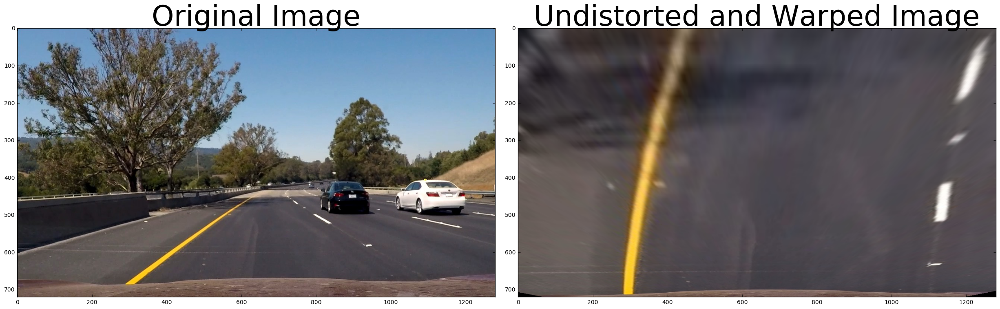

In [16]:
# Visualizing the perspective transform

top_down, perspective_M, inverse_M = perspective_transform(pre_thresh, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(pre_thresh)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

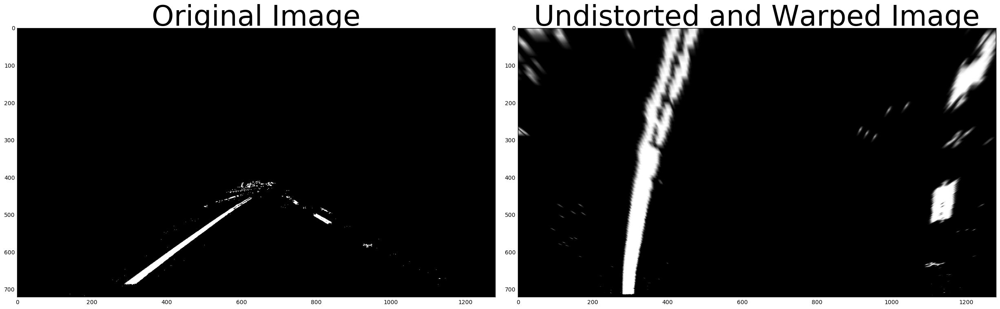

In [17]:
top_down_gray, perspective_M, inverse_M = perspective_transform(post_thresh, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(post_thresh, cmap='gray')
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down_gray, cmap='gray')
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Finding the lines, and measuring curvature

In [18]:
# As suggested, we define a class to receive the characteristics of each line detection
# change to fp format later...
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False
        # x values of the last n fits of the line
        self.recent_xfitted = []
        #average x values of the fitted line over the last n iterations
        self.bestx = None
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        #radius of curvature of the line in some units
        self.radius_of_curvature = None
        #distance in meters of vehicle center from the line
        self.line_base_pos = None
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')
        #x values for detected line pixels
        self.allx = None
        #y values for detected line pixels
        self.ally = None

In [90]:
# Looking at the line class, some of the methods that need to be establish include..

def find_peaks(image):
    histogram = np.sum(image[image.shape[0]/2:,:], axis=0)
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    return leftx_base, rightx_base

def calculate_average_coefficients(existing_coefficient, new_coefficient):
    coefficient = existing_coefficient
    return coefficient

def find_radius_of_curvature(yvals, fitx, left_or_right='r'):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(yvals)
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    if left_or_right == 'l' or 'L':
        left_curverad = ((1 + (2*fitx[0]*y_eval*ym_per_pix + fitx[1])**2)**1.5) / np.absolute(2*fitx[0])
        return left_curverad
    elif left_or_right == 'r' or 'R':
        right_curverad = ((1 + (2*fitx[0]*y_eval*ym_per_pix + fitx[1])**2)**1.5) / np.absolute(2*fitx[0])
        return right+curverad
    else:
        print("Invalid direction was input.")


In [91]:
def find_position(pts):
    # Find the position of the car from the center
    # It will show if the car is 'x' meters from the left or right
    position = image_shape[1]/2
    left  = np.min(pts[(pts[:,1] < position) & (pts[:,0] > 700)][:,1])
    right = np.max(pts[(pts[:,1] > position) & (pts[:,0] > 700)][:,1])
    center = (left + right)/2
    # Define conversions in x and y from pixels space to meters
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension    
    return (position - center)*xm_per_pix

In [92]:
def predict_using_polynomials(left_lane, right_lane, image_shape):
    yvals = np.linspace(0, 100, num=101)*7.2
    left_lane_fitx = left_lane.current_fit[0]*yvals**2 + left_lane.current_fit[1]*yvals + left_lane.current_fit[2]
    right_lane_fitx = right_lane.current_fit[0]*yvals**2 + right_lane.current_fit[1]*yvals + right_lane.current_fit[2]
    return yvals, left_lane_fitx, right_lane_fitx

In [93]:
# Set the width of the windows +/- margin
#margin = 100
# Set minimum number of pixels found to recenter window
#minpix = 50
# Choose the number of sliding windows
#nwindows = 9

# Currently this isn't fail proof. If a lane disappears and then reappears
# there is no way of readjusting..
def fit_lane(left_lane, right_lane, image, nwindows, margin, minpix):
    if left_lane.detected == True & right_lane.detected == True:
        
        left_lane_inds = ((left_lane.allx > (left_lane.current_fit[0]*(left_lane.ally**2) +\
                                             left_lane.current_fit[1]*left_lane.ally +\
                                             left_lane.current_fit[2] - margin)) &\
                          (left_lane.allx < (left_lane.current_fit[0]*(left_lane.ally**2) +\
                                             left_lane.current_fit[1]*left_lane.ally +\
                                             left_lane.current_fit[2] + margin)))
        right_lane_inds = ((right_lane.allx > (right_lane.current_fit[0]*(right_lane.ally**2) +\
                                               right_lane.current_fit[1]*right_lane.ally +\
                                               right_lane.current_fit[2] - margin)) &\
                           (right_lane.allx < (right_lane.current_fit[0]*(right_lane.ally**2) +\
                                               right_lane.current_fit[1]*right_lane.ally +\
                                               right_lane.current_fit[2] + margin)))
        
        left_lane.allx = nonzerox[left_lane_inds]
        left_lane.ally = nonzeroy[left_lane_inds]
        right_lane.allx = nonzerox[right_lane_inds]
        right_lane.ally = nonzeroy[right_lane_inds]
        
        left_fit = np.polyfit(left_lane.ally, left_lane.allx, 2)
        right_fit = np.polyfit(right_lane.ally, right_lane.allx, 2)

        # push polynomial to lanes
        left_lane.current_fit = left_fit
        right_lane.current_fit = right_fit
 
        # Calculate x with polynomials calculated.
        yvals, left_fitx, right_fitx = predict_using_polynomials(left_lane, right_lane, image.shape)
        
        yvals = np.linspace(0, 100, num=101)*7.2
        # measure curvature
        left_lane.radius_of_curvature = find_radius_of_curvature(yvals, left_fitx, 'l')
        right_lane.radius_of_curvature = find_radius_of_curvature(yvals, right_fitx, 'r')
        
        return yvals, left_fitx, right_fitx
    else:
        # get coords for the binary values we are interested in
        nonzero = image.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        window_height = np.int(image.shape[0]/nwindows)
        left_lane_inds = []
        right_lane_inds = []
        
        # find initial peaks to draw the left and right lanes
        leftx_base, rightx_base = find_peaks(image)
        leftx_current = leftx_base
        rightx_current = rightx_base
        
        # dividing the image up into n windows
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = image.shape[0] - (window+1)*window_height
            win_y_high = image.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high)\
                              & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high)\
                               & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        left_lane.allx = nonzerox[left_lane_inds]
        left_lane.ally = nonzeroy[left_lane_inds] 
        right_lane.allx = nonzerox[right_lane_inds]
        right_lane.ally = nonzeroy[right_lane_inds]

        # Fit a second order polynomial to each
        left_fit = np.polyfit(left_lane.ally, left_lane.allx, 2)
        right_fit = np.polyfit(right_lane.ally, right_lane.allx, 2)

        # push polynomial to lanes
        left_lane.current_fit = left_fit
        right_lane.current_fit = right_fit

        # Calculate x with polynomials calculated.
        yvals, left_fitx, right_fitx = predict_using_polynomials(left_lane, right_lane, image.shape)

        yvals = np.linspace(0, 100, num=101)*7.2
        # measure curvature
        left_lane.radius_of_curvature = find_radius_of_curvature(yvals, left_fitx, 'l')
        right_lane.radius_of_curvature = find_radius_of_curvature(yvals, right_fitx, 'r')
        
        left_lane.detected == True
        right_lane.detected == True
        
        return yvals, left_fitx, right_fitx

('left lane curvature is', 98863.876213870724)
('right lane curvature is', 787951.11758418288)


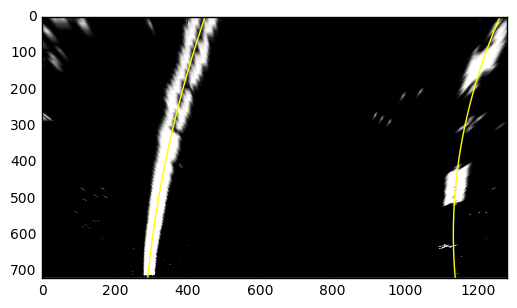

In [94]:
left_lane = Line()
right_lane = Line()

yvals, left_fitx, right_fitx = fit_lane(left_lane, right_lane, top_down_gray, 9, 100, 100)

left_fit = left_lane.current_fit
right_fit = right_lane.current_fit

plt.imshow(top_down_gray, cmap='gray')
plt.plot(left_fitx, yvals, color='yellow')
plt.plot(right_fitx, yvals, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

print("left lane curvature is", left_lane.radius_of_curvature)
print("right lane curvature is", right_lane.radius_of_curvature)


In [95]:
# main process should consist of masking, perspective transform, and polyfit. Also should have layover on image
def draw_lane_on_image(original_image, warped_image, yvals, left_fitx, right_fitx, Minv):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (original_image.shape[1], original_image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(original_image, 1, newwarp, 0.3, 0)
    font_scale=1
    thickness=2
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = "Radius of Curvature: {} m".format(int(left_lane.radius_of_curvature))
    cv2.putText(result,text,(400,100), font, font_scale,(255,255,255), thickness)
    # Find the position of the car
    pts = np.argwhere(newwarp[:,:,1])
    position = find_position(pts)
    if position < 0:
        text = "Vehicle is {:.2f} m left of center".format(-position)
    else:
        text = "Vehicle is {:.2f} m right of center".format(position)
    cv2.putText(result,text,(400,200), font, 1,(255,255,255),2)
    return result

In [97]:
def advanced_lane_detection(image):
    # Mask and filter the colors to mark out regions of interest
    img = combined_thresh(image)
    # Warp the image to make lanes parallel to each other
    top_down, perspective_M, perspective_Minv = perspective_transform(img, mtx, dist)
    # Find the lines fitting to left and right lanes
    yvals, l_fitx, r_fitx = fit_lane(left_lane, right_lane, top_down, 9, 100, 100)
    # Return the original image with colored region
    return draw_lane_on_image(image, top_down, yvals, l_fitx, r_fitx, perspective_Minv)

In [98]:
### Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
# Set up lines for left and right
left_lane = Line()
right_lane = Line()
white_output = 'output.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(advanced_lane_detection) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


100%|█████████▉| 1260/1261 [04:49<00:00,  4.44it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 

CPU times: user 18min 30s, sys: 1min 21s, total: 19min 51s
Wall time: 4min 49s
